In [ ]:
# I did this previously in the other notebook
# results_file = 'write/rb.h5ad'  # the file that will store the analysis results
# adata_rb.write(results_file)

In [ ]:
import os 

In [ ]:
import scanpy as sc
adata = sc.read_h5ad("/scratch/user/s4735100/rb.h5ad")
adata

AnnData object with n_obs × n_vars = 89927 × 1393
    obs: 'patient_id', 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'patient_id_colors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
#import scanpy as sc
#adata = sc.read_h5ad("/scratch/user/s4735100/harmony.h5ad")

In [ ]:
import pandas as pd 
import numpy as np

/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


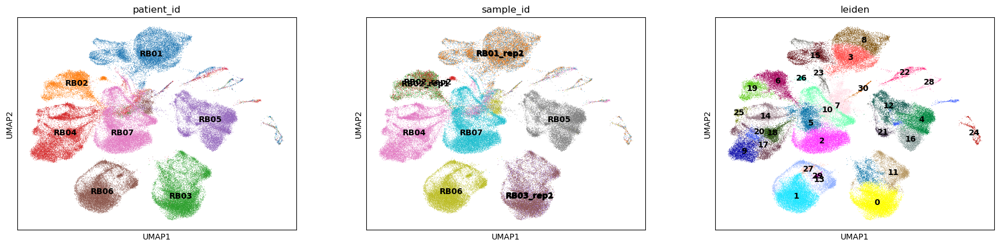

In [ ]:
sc.pl.umap(adata, color=['patient_id','sample_id', 'leiden'], legend_loc='on data')

In [ ]:
pip install harmonypy

Note: you may need to restart the kernel to use updated packages.


In [ ]:
# Kelvin suggest to do batch correction because each patient was its own cluster
sc.external.pp.harmony_integrate(adata, key="sample_id", basis='X_pca', adjusted_basis='X_pca_harmony', )

2023-08-16 15:59:18,500 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-08-16 15:59:45,134 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-08-16 15:59:45,705 - harmonypy - INFO - Iteration 1 of 10
2023-08-16 16:00:15,230 - harmonypy - INFO - Iteration 2 of 10
2023-08-16 16:00:44,721 - harmonypy - INFO - Converged after 2 iterations


In [ ]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40, use_rep="X_pca_harmony")

/home/s4735100/mambaforge/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/s4735100/mambaforge/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/s4735100/mambaforge/lib/python3.10/site-packages/umap/distances.py:1086: NumbaDepr

In [ ]:
sc.tl.leiden(adata)
sc.tl.umap(adata)

/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


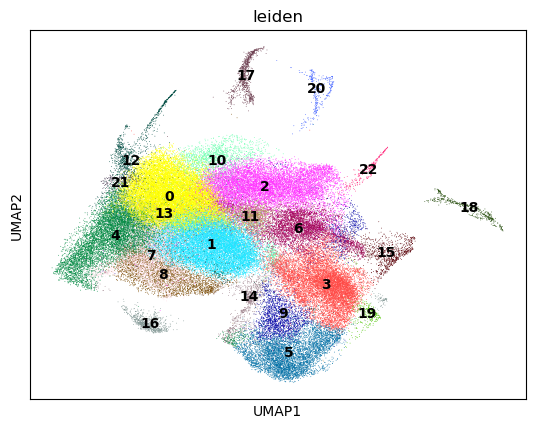

In [ ]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data')

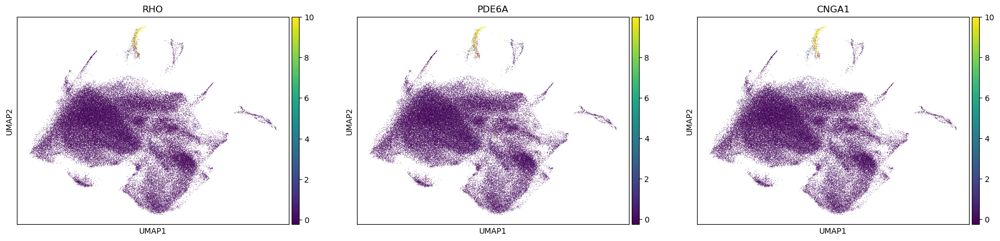

In [ ]:
sc.pl.umap(adata, color=['RHO', 'PDE6A', 'CNGA1'], use_raw=False)
# Rod genes  

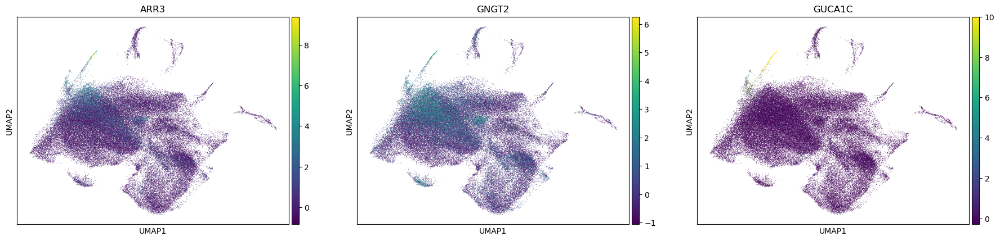

In [ ]:
sc.pl.umap(adata, color=['ARR3', 'GNGT2', 'GUCA1C'], use_raw=False)

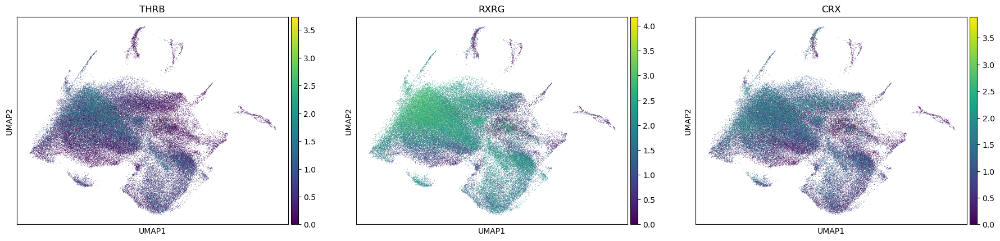

In [ ]:
sc.pl.umap(adata, color=['THRB', 'RXRG', 'CRX'])
# early cone, early cone and rgc, cone rod and bp cell 

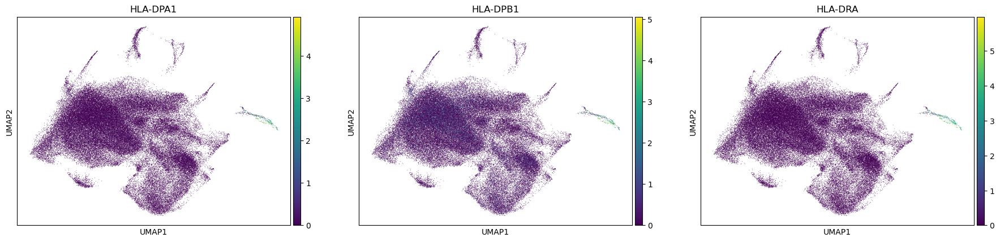

In [ ]:
sc.pl.umap(adata, color=['HLA-DPA1', 'HLA-DPB1', 'HLA-DRA'])
# microglia 

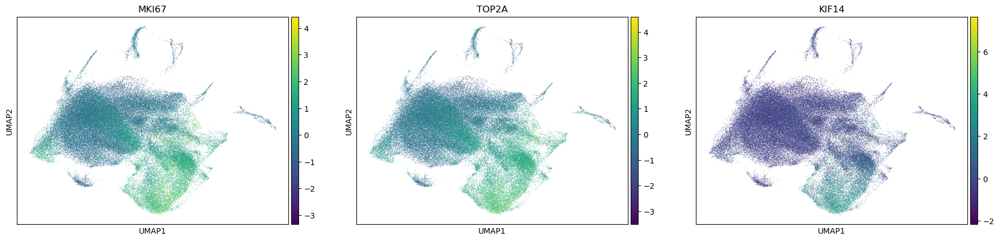

In [ ]:
sc.pl.umap(adata, color=['MKI67', 'TOP2A', 'KIF14'], use_raw=False)
#proliferation-related markers - tumour cells??

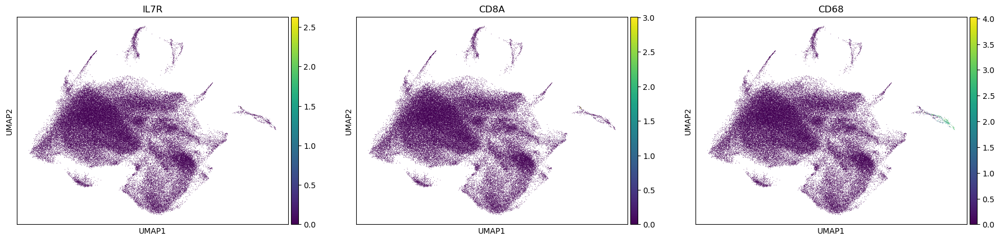

In [ ]:
sc.pl.umap (adata, color=['IL7R', 'CD8A', 'CD68'])

In [ ]:
results_file = '/scratch/user/s4735100/harmony.h5ad'

In [ ]:
adata.write(results_file)


In [ ]:
adata = sc.read_h5ad("/scratch/user/s4735100/harmony.h5ad")

In [ ]:
adata.uns['log1p']["base"] = None 

/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is h

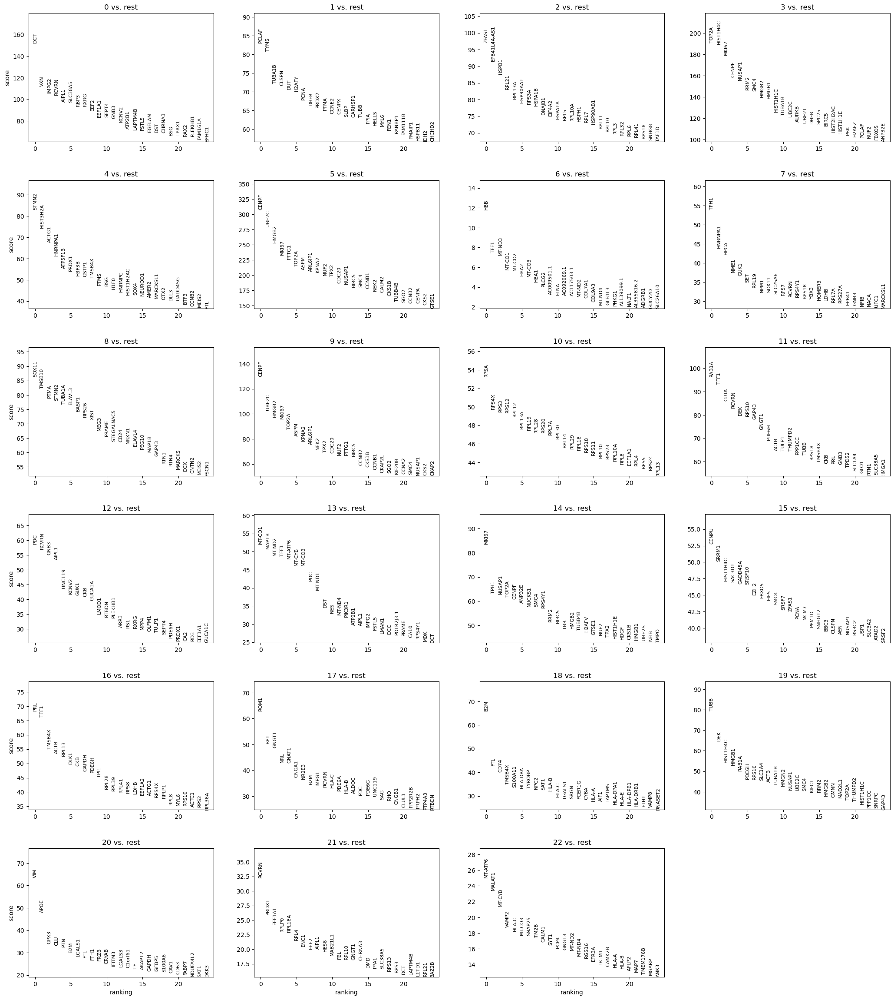

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

ranking genes


    finished (0:03:23)


/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is h

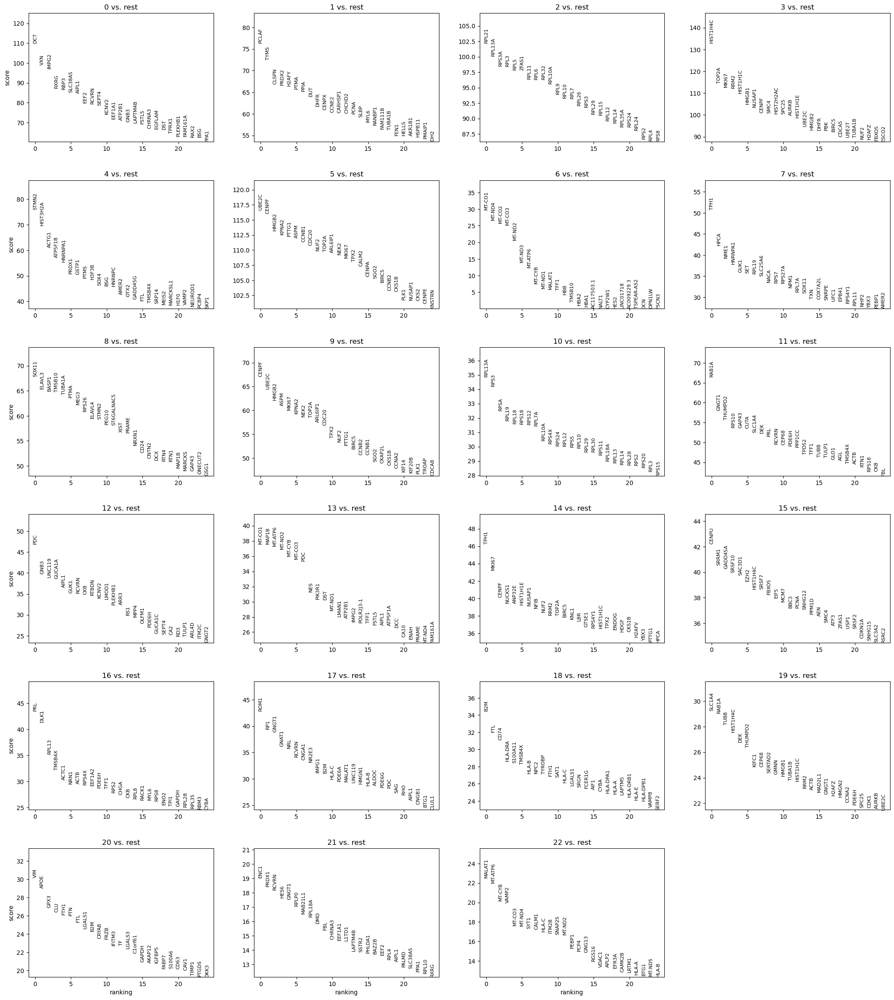

In [ ]:
sc.settings.verbosity = 2  # reduce the verbosity
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

ranking genes


    finished (0:00:24)


/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/s4735100/mambaforge/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is h

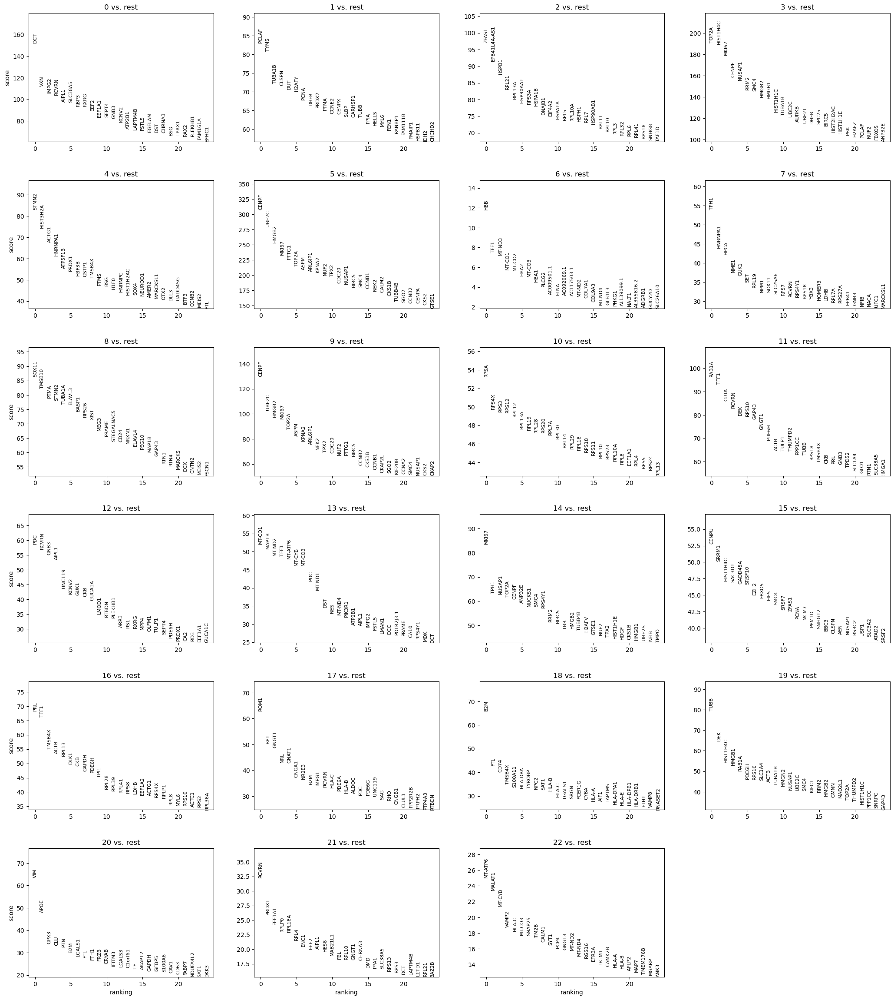

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [ ]:
results_file = '/scratch/user/s4735100/harmony.h5ad'

In [ ]:
adata.write(results_file)

In [ ]:
#rerun from here 
import scanpy as sc
adata = sc.read_h5ad("/scratch/user/s4735100/harmony.h5ad")
adata

AnnData object with n_obs × n_vars = 89927 × 1393
    obs: 'patient_id', 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'patient_id_colors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/s4735100/mambaforge/envs/bunya_medi7281/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


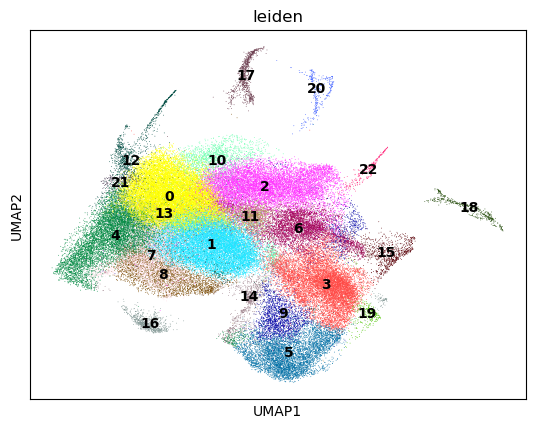

In [ ]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data')

/home/s4735100/mambaforge/envs/bunya_medi7281/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


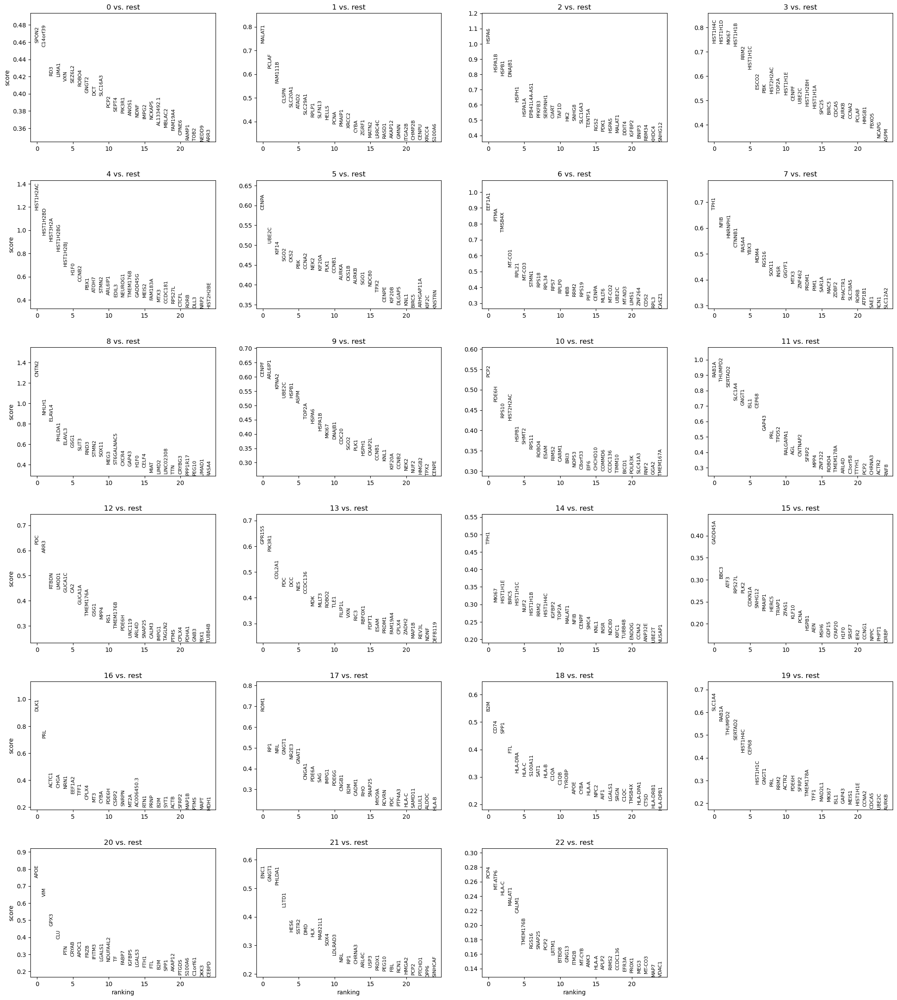

In [ ]:
#Used sag as solver because the data set was too big for the default one 
adata.uns['log1p']["base"] = None 
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg', solver='sag')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [ ]:
results_file = '/scratch/user/s4735100/harmony.h5ad'

In [ ]:
adata_result = sc.read(results_file)


In [4]:
import scanpy as sc
adata = sc.read_h5ad("/scratch/user/s4735100/harmony.h5ad")
adata

AnnData object with n_obs × n_vars = 89927 × 1393
    obs: 'patient_id', 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'patient_id_colors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/s4735100/mambaforge/envs/bunya_medi7281/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


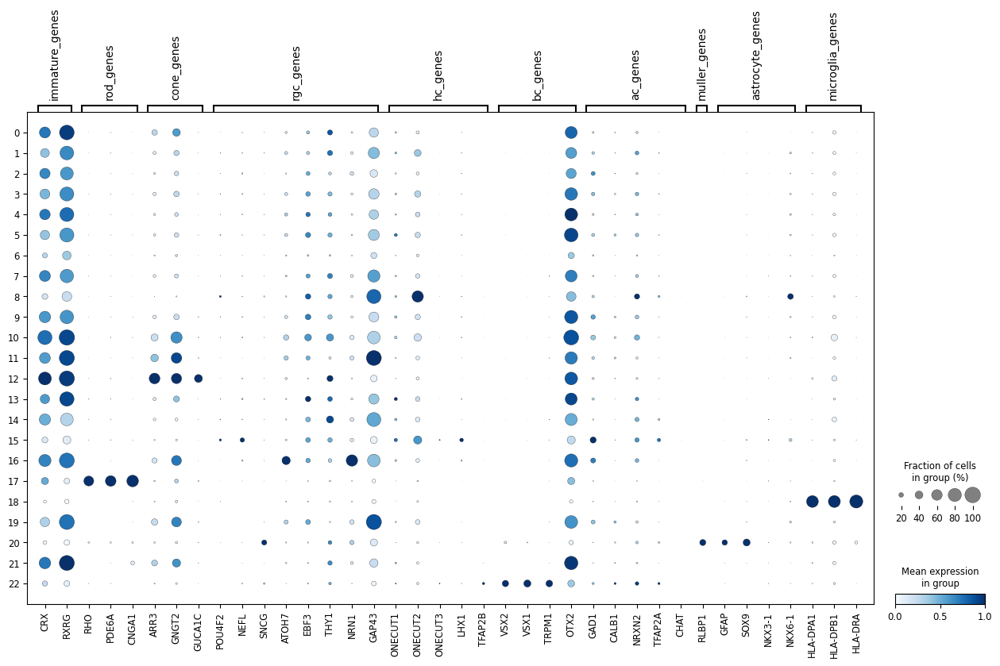

In [5]:
#how to define groups of genes as the same cell type
retinal_gene_dictionary = {
    "immature_genes": ["CRX", "RXRG"],
    "rod_genes":["RHO", "PDE6A", "CNGA1"],
    "cone_genes":["ARR3", "GNGT2", "GUCA1C"],
    "rgc_genes": ["POU4F2", "NEFL", "SNCG", "ATOH7", "EBF3", "THY1", "NRN1", "GAP43"],
    "hc_genes": ["ONECUT1", "ONECUT2", "ONECUT3", "LHX1", "TFAP2B"],
    "bc_genes": ["VSX2", "VSX1", "TRPM1", "OTX2"],
    "ac_genes": ["GAD1", "CALB1", "NRXN2", "TFAP2A", "CHAT"],
    "muller_genes": ["RLBP1"],
    "astrocyte_genes": ["GFAP", "SOX9", "NKX3-1", "NKX6-1"],
    "microglia_genes": ["HLA-DPA1", "HLA-DPB1", "HLA-DRA"],
    }
sc.pl.dotplot(adata, retinal_gene_dictionary, groupby="leiden", cmap="Blues", standard_scale="var")

/home/s4735100/mambaforge/envs/bunya_medi7281/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


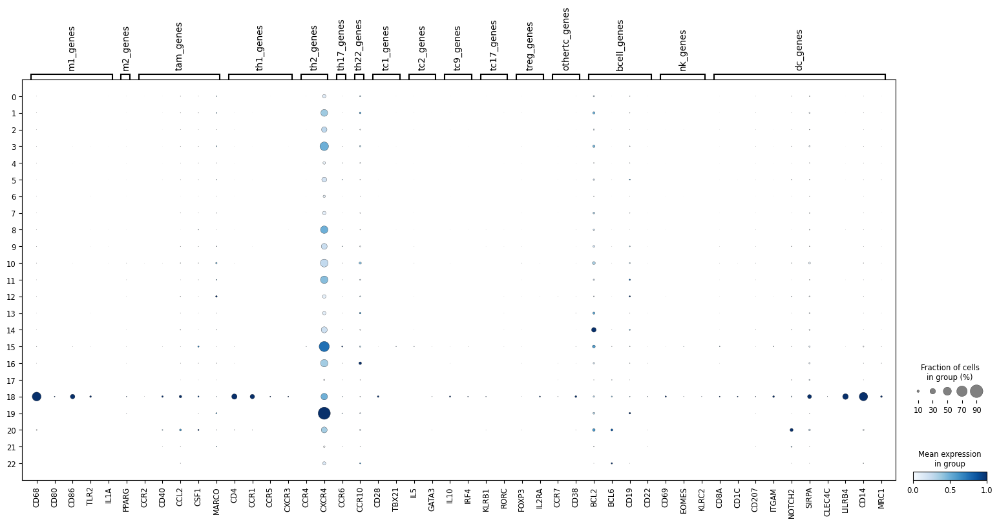

In [7]:
 immune_gene_dictionary = {
    "m1_genes": ["CD68", "CD80", "CD86", "TLR2", "IL1A"],
    "m2_genes": ["PPARG"],
    "tam_genes": ["CCR2", "CD40", "CCL2", "CSF1", "MARCO"], 
    "th1_genes": ["CD4", "CCR1", "CCR5", "CXCR3"], 
    "th2_genes": ["CCR4", "CXCR4"],
    "th17_genes": ["CCR6"],
    "th22_genes": ["CCR10"],
    "tc1_genes": ["CD28", "TBX21"],
    "tc2_genes": ["IL5", "GATA3"], 
    "tc9_genes": ["IL10", "IRF4"], 
    "tc17_genes": ["KLRB1", "RORC"],
    "treg_genes": ["FOXP3", "IL2RA"],
    "othertc_genes": ["CCR7", "CD38"],
    "bcell_genes": ["BCL2", "BCL6", "CD19", "CD22"],
    "nk_genes": ["CD69", "EOMES", "KLRC2"],
    "dc_genes": ["CD8A", "CD1C", "CD207", "ITGAM", "NOTCH2", "SIRPA", "CLEC4C", "LILRB4", "CD14", "MRC1"]
    }
 sc.pl.dotplot(adata, immune_gene_dictionary, groupby="leiden", cmap="Blues", standard_scale="var")
 #Could not find keys '['ARG1', 'CCR3', 'CCR8', 'CD115', 'CD16', 'CD20', 'CD206', 'CD3', 'CD45RA', 'CD45RO', 'CD56', 
 # 'CD8', 'CLEC9A', 'IL12R', 'IL17', 'IL18R', 'IL1R', 'IL1a', 'IL2', 'IL27R', 'IL4', 'IL9', 'IgG', 'IgM', 'PDL2', 'TNFalpha']' in columns of `adata.obs` or in adata.raw.var_names.

In [3]:
import scanpy as sc
adata = sc.read_h5ad("/scratch/user/s4735100/harmony.h5ad")
adata

AnnData object with n_obs × n_vars = 89927 × 1393
    obs: 'patient_id', 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'patient_id_colors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/s4735100/mambaforge/envs/bunya_medi7281/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


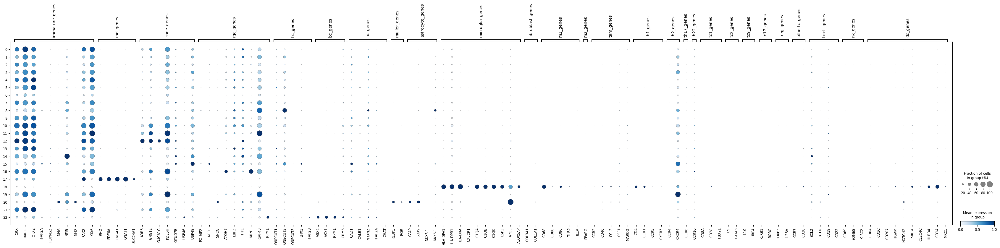

In [36]:
gene_dictionary = {
    "immature_genes": ["CRX", "RXRG", "OTX2", "TFAP2A", "RBPMS2", "NFIA", "NFIB", "NFIX", "RAX2", "SIX6"],
    "rod_genes":["RHO", "PDE6A", "CNGA1", "GNAT1", "SLC24A1"],
    "cone_genes":["ARR3", "GNGT2", "GUCA1C", "PDE6H", "OTUD7B", "USP46", "USP48"],
    "rgc_genes": ["POU4F2", "NEFL", "SNCG", "ATOH7", "EBF3", "THY1", "NRN1", "GAP43", "TRPM1"],
    "hc_genes": ["ONECUT1", "ONECUT2", "ONECUT3", "LHX1", "TFAP2B"],
    "bc_genes": ["VSX2", "VSX1", "TRPM1", "GRM6"],
    "ac_genes": ["GAD1", "CALB1", "NRXN2", "TFAP2A", "CHAT"],
    "muller_genes": ["RLBP1", "RGR"],
    "astrocyte_genes": ["GFAP", "SOX9", "NKX3-1", "NKX6-1"],
    "microglia_genes": ["HLA-DPA1", "HLA-DPB1", "HLA-DRA", "CX3CR1", "C1QA", "C1QB", "C1QC", "LSP1", "APOE", "ALOX5AP"],
    "fibroblast_genes": ["COL3A1", "COL1A1"],
    "m1_genes": ["CD68", "CD80", "CD86", "TLR2", "IL1A"],
    "m2_genes": ["PPARG"],
    "tam_genes": ["CCR2", "CD40", "CCL2", "CSF1", "MARCO"], 
    "th1_genes": ["CD4", "CCR1", "CCR5", "CXCR3"], 
    "th2_genes": ["CCR4", "CXCR4"],
    "th17_genes": ["CCR6"],
    "th22_genes": ["CCR10"],
    "tc1_genes": ["CD8A", "CD28", "TBX21"],
    "tc2_genes": ["IL5", "GATA3"], 
    "tc9_genes": ["IL10", "IRF4"], 
    "tc17_genes": ["KLRB1", "RORC"],
    "treg_genes": ["FOXP3", "IL2RA"],
    "othertc_genes": ["CCR7", "CD38"],
    "bcell_genes": ["BCL2", "BCL6", "CD19", "CD22"],
    "nk_genes": ["CD69", "EOMES", "KLRC2"],
    "dc_genes": ["CD8A", "CD1C", "CD207", "ITGAM", "NOTCH2", "SIRPA", "CLEC4C", "LILRB4", "CD14", "MRC1"], 
    }
sc.pl.dotplot(adata, gene_dictionary, groupby="leiden", cmap="Blues", standard_scale="var")

In [22]:
import pandas as pd

In [23]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)


,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,DCT,PCLAF,ZFAS1,TOP2A,STMN2,CENPF,HBB,TPH1,SOX11,CENPF,...,MT-CO1,MKI67,CENPU,PRL,ROM1,B2M,TUBB,VIM,RCVRN,MT-ATP6
1,VXN,TYMS,EPB41L4A-AS1,HIST1H4C,HIST3H2A,UBE2C,TFF1,HNRNPA1,TMSB10,UBE2C,...,MAP1B,TPH1,SRRM1,TFF1,RP1,FTL,DEK,APOE,PRDX1,MALAT1
2,IMPG2,TUBA1B,HSPB1,MKI67,ACTG1,HMGB2,MT-ND3,HPCA,PTMA,HMGB2,...,MT-ND2,NUSAP1,HIST1H4C,TMSB4X,GNGT1,CD74,HIST1H4C,GPX3,EEF1A1,MT-CYB
3,RCVRN,CLSPN,RPL21,CENPF,HNRNPA1,MKI67,MT-CO1,NME1,STMN2,MKI67,...,TFF1,TOP2A,SAC3D1,ACTB,NRL,TMSB4X,HMGB1,CLU,RPLP0,VAMP2
4,AIPL1,DUT,RPL13A,NUSAP1,ATP5F1B,PTTG1,MT-CO2,GUK1,TUBA1A,TOP2A,...,MT-ATP6,CENPF,GADD45A,RPL13,GNAT1,S100A11,RAB1A,PTN,RPL18A,HLA-C


In [24]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,18_n,18_p,19_n,19_p,20_n,20_p,21_n,21_p,22_n,22_p
0,DCT,0.0,PCLAF,0.0,ZFAS1,0.0,TOP2A,0.0,STMN2,0.0,...,B2M,2.976061e-229,TUBB,9.931128e-226,VIM,3.978929e-182,RCVRN,1.404416e-99,MT-ATP6,2.158561e-72
1,VXN,0.0,TYMS,0.0,EPB41L4A-AS1,0.0,HIST1H4C,0.0,HIST3H2A,0.0,...,FTL,4.325131e-158,DEK,5.821983e-196,APOE,3.811964e-147,PRDX1,5.206531e-78,MALAT1,3.351139e-67
2,IMPG2,0.0,TUBA1B,0.0,HSPB1,0.0,MKI67,0.0,ACTG1,0.0,...,CD74,5.034896e-148,HIST1H4C,8.664695e-168,GPX3,1.292106e-107,EEF1A1,1.666738e-72,MT-CYB,3.049006e-60
3,RCVRN,0.0,CLSPN,0.0,RPL21,0.0,CENPF,0.0,HNRNPA1,0.0,...,TMSB4X,1.085188e-128,HMGB1,4.596733e-168,CLU,2.816830e-105,RPLP0,1.003894e-67,VAMP2,9.552496e-51
4,AIPL1,0.0,DUT,0.0,RPL13A,0.0,NUSAP1,0.0,ATP5F1B,0.0,...,S100A11,1.892092e-123,RAB1A,1.047497e-156,PTN,3.598763e-103,RPL18A,1.253214e-67,HLA-C,5.642376e-49


In [27]:
adata.uns['log1p']["base"] = None 
#googled how to fix key error 'base' for sc.tl.rank_genes_groups command

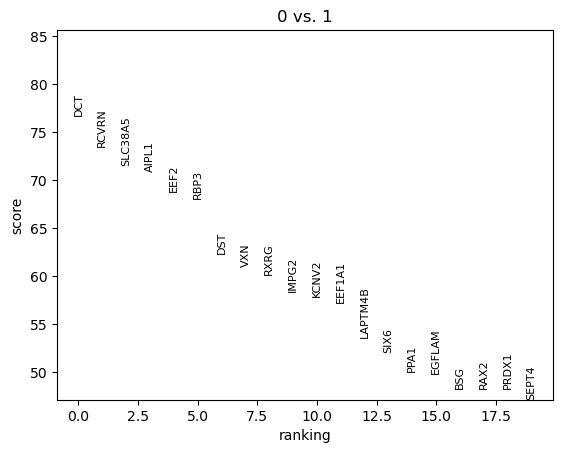

In [28]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)
#key error 'base' came up the first time this was run 

/home/s4735100/mambaforge/envs/bunya_medi7281/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


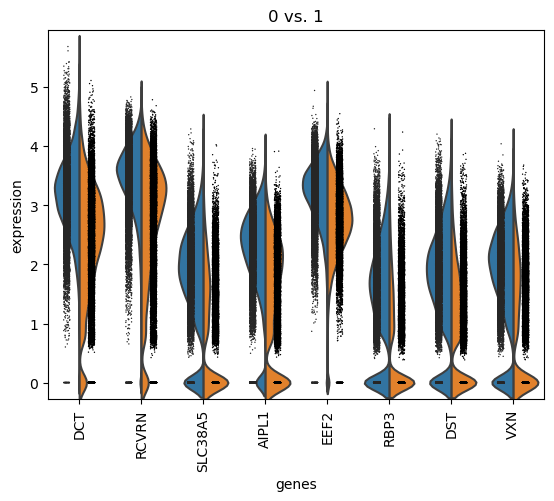

In [30]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)


In [ ]:
adata = sc.read(results_file)


/home/s4735100/mambaforge/envs/bunya_medi7281/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


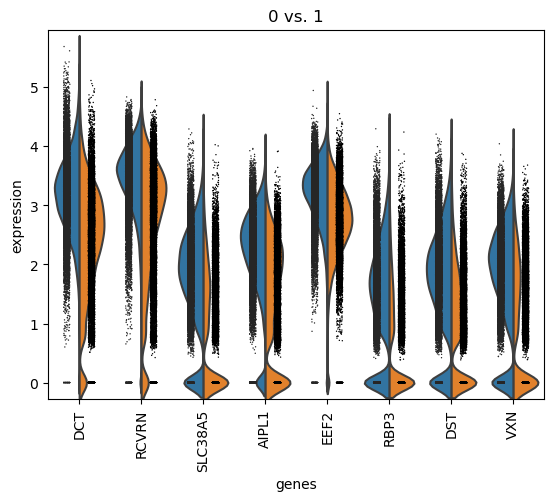

In [31]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)


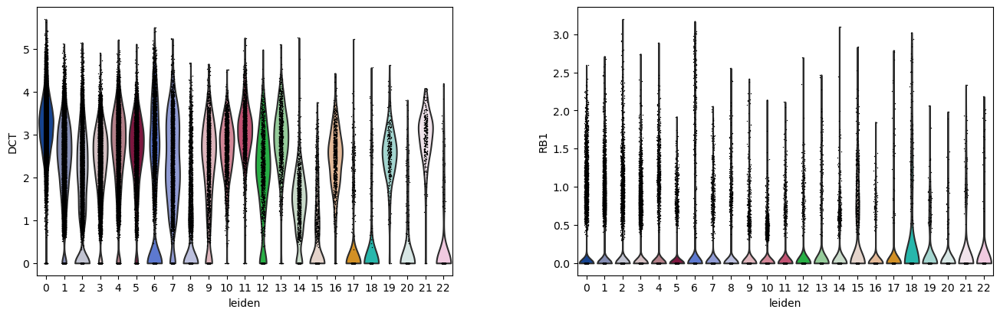

In [33]:
sc.pl.violin(adata, ['DCT', 'RB1'], groupby='leiden')


In [37]:
new_cluster_names = [
    'CP1', 'RPC1', 'RPC2', 'RPC3', 'RPC4', 
    'RPC5', 'unknown1', 'RPC6', 'Interneuron', 'RPC7',
    'CP2', 'CP3', 'CP4', 'CP5', 'RPC8', 
    'unknown2', 'RPC9', 'Rod', 'Microglia1', 'CP6',
    'Microglia2', 'CP7', 'BC']
adata.rename_categories('leiden', new_cluster_names)
#unknown 1 has very little markers of anything 
#Interneuron has markers of both horizontal cell and rgc, 
#CP3 has also rgc marker, so may be both cone and rgc progenitor cells?
#RPC8 is late stage, responsible for muller and bipolar cell proliferation and regulation 
#unknown2 has cone  and some th2 marker but lack precursor genes and DCT, so should be a healthy mature cell type 
#CP6 also has th2 marker, what does it mean?
#Is the last cluster actually BC? because it has low number of cells highly expressing BC marker? 

Omitting rank_genes_groups/names as old categories do not match.
Omitting rank_genes_groups/scores as old categories do not match.
Omitting rank_genes_groups/pvals as old categories do not match.
Omitting rank_genes_groups/pvals_adj as old categories do not match.
Omitting rank_genes_groups/logfoldchanges as old categories do not match.


/home/s4735100/mambaforge/envs/bunya_medi7281/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


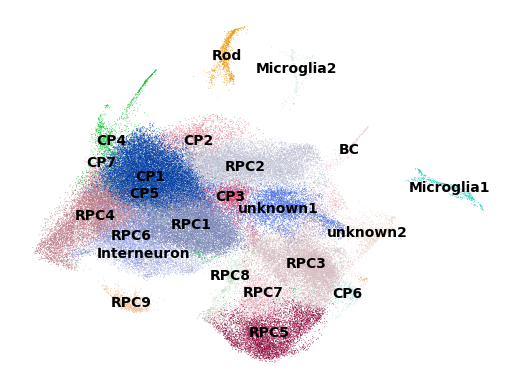

In [38]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')
#does the colour also represent how simlar the clusters are 


/home/s4735100/mambaforge/envs/bunya_medi7281/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


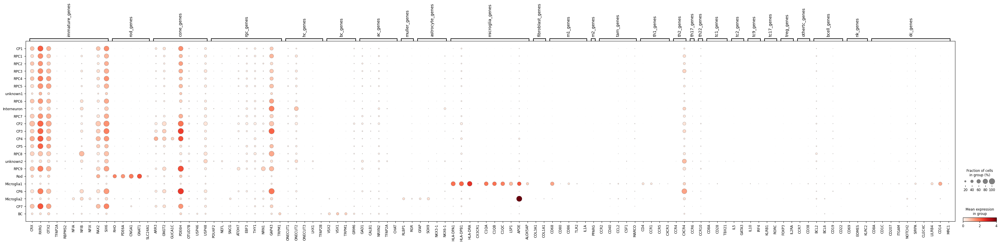

In [45]:
sc.pl.dotplot(adata, gene_dictionary, groupby='leiden');


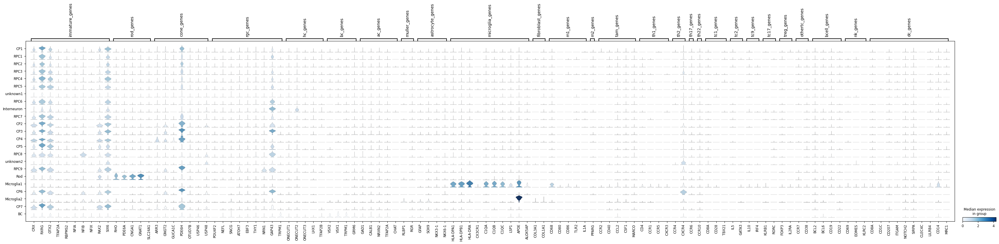

In [46]:
sc.pl.stacked_violin(adata, gene_dictionary, groupby='leiden', rotation=90);


In [48]:
results_file = '/scratch/user/s4735100/harmony.h5ad'
adata.write(results_file)